# Using "Satellite Images of Water Bodies" dataset from kaggle

In [1]:
!kaggle datasets download -d franciscoescobar/satellite-images-of-water-bodies

Dataset URL: https://www.kaggle.com/datasets/franciscoescobar/satellite-images-of-water-bodies
License(s): CC-BY-NC-SA-4.0
100% 247M/247M [00:14<00:00, 21.5MB/s]
100% 247M/247M [00:14<00:00, 17.4MB/s]


## Unzip the dataset

In [2]:
!unzip "/content/satellite-images-of-water-bodies.zip"

Streaming output truncated to the last 5000 lines.
  inflating: Water Bodies Dataset/Images/water_body_1808.jpg  
  inflating: Water Bodies Dataset/Images/water_body_1809.jpg  
  inflating: Water Bodies Dataset/Images/water_body_1810.jpg  
  inflating: Water Bodies Dataset/Images/water_body_1811.jpg  
  inflating: Water Bodies Dataset/Images/water_body_1812.jpg  
  inflating: Water Bodies Dataset/Images/water_body_1813.jpg  
  inflating: Water Bodies Dataset/Images/water_body_1814.jpg  
  inflating: Water Bodies Dataset/Images/water_body_1815.jpg  
  inflating: Water Bodies Dataset/Images/water_body_1816.jpg  
  inflating: Water Bodies Dataset/Images/water_body_1817.jpg  
  inflating: Water Bodies Dataset/Images/water_body_1818.jpg  
  inflating: Water Bodies Dataset/Images/water_body_1819.jpg  
  inflating: Water Bodies Dataset/Images/water_body_182.jpg  
  inflating: Water Bodies Dataset/Images/water_body_1820.jpg  
  inflating: Water Bodies Dataset/Images/water_body_1822.jpg  
  inf

# Notebook Will have 2 parts
## Mask Segmentation
## Point Segmentaion wich is also refred to as incomplete Tagging

# Complete Mask Segmentation

In [24]:
import os
import cv2 as cv
from keras.metrics import MeanIoU
from tqdm import tqdm
import numpy as np
from keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt
import keras
import tensorflow as tf
from keras.layers import Conv2D, MaxPool2D, Dropout, BatchNormalization, Input, Conv2DTranspose, concatenate, GlobalAveragePooling2D, Dense
from keras import Sequential
from keras.callbacks import EarlyStopping, ModelCheckpoint

In [27]:
def show_image(image, cmap=None, title=None):
  plt.imshow(image, cmap=cmap)
  if title is not None: plt.title(title)
  plt.axis('off')


## Checking if the Images and masks are placed Fine

In [17]:
images = list()
mask = list()

image_path = '/content/Water Bodies Dataset/Images/'
mask_path = '/content/Water Bodies Dataset/Masks/'

image_names = sorted(next(os.walk(image_path))[-1])
mask_names = sorted(next(os.walk(mask_path))[-1])

if image_names == mask_names:
  print('Image and Mask are corretly Placed!!')

Image and Mask are corretly Placed!!


##Resizing Images and Masks to Size 128

In [18]:
SIZE = 128
images = np.zeros(shape=(len(image_names),SIZE, SIZE, 3))
masks = np.zeros(shape=(len(image_names),SIZE, SIZE, 1))

for id in tqdm(range(len(image_names)), desc="Images"):
  path = image_path + image_names[id]
  img = img_to_array(load_img(path)).astype('float')/255.
  img = cv.resize(img, (SIZE,SIZE), cv.INTER_AREA)
  images[id] = img

for id in tqdm(range(len(mask_names)), desc="Mask"):
  path = mask_path + mask_names[id]
  mask = img_to_array(load_img(path)).astype('float')/255.
  mask = cv.resize(mask, (SIZE,SIZE), cv.INTER_AREA)
  masks[id] = mask[:,:,:1]

Mask: 100%|██████████| 2841/2841 [00:31<00:00, 89.87it/s] 


## Lets See What do we have here

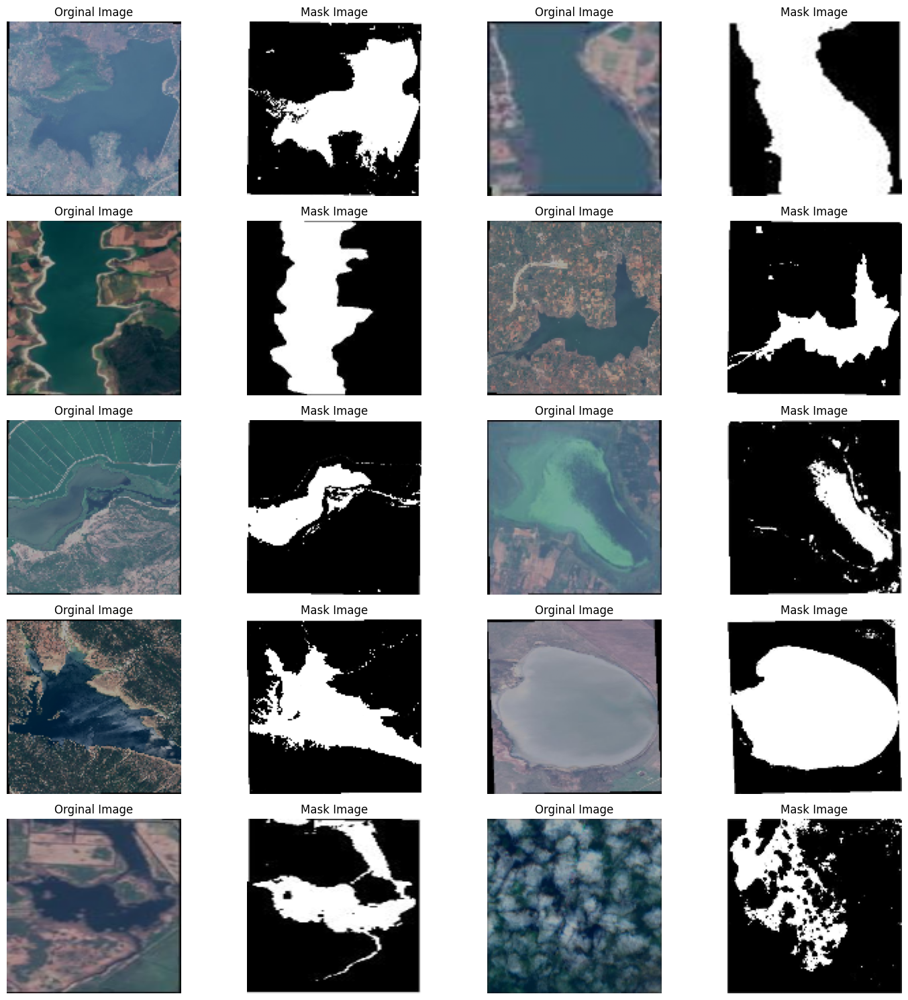

In [19]:
plt.figure(figsize=(15,15))
for i in range(1,21):
  plt.subplot(5,4,i)

  if i%2!=0:
    id = np.random.randint(len(images))
    show_image(images[id], title="Orginal Image")
  elif i%2==0:
    show_image(masks[id].reshape(128,128), title="Mask Image", cmap='gray')

plt.tight_layout()
plt.show()

# Spliting into training and Testing

In [60]:
X, y = images[:int(len(images)*0.9)], masks[:int(len(images)*0.9)]
test_X, test_y = images[int(len(images)*0.9):], masks[int(len(images)*0.9):]

## A fucntion for processed images

In [59]:
def post_process(image,threshold=0.4):
  return image>threshold

## U-Net Architecture: Contraction and Expansion Blocks

In [61]:
# Contraction
class EncoderBlock(keras.layers.Layer):

  def __init__(self, filters, rate=None, pooling=True):
    super(EncoderBlock,self).__init__()
    self.filters = filters
    self.rate = rate
    self.pooling = pooling
    self.conv1 = Conv2D(self.filters,kernel_size=3,strides=1,padding='same',activation='relu',kernel_initializer='he_normal')
    self.conv2 = Conv2D(self.filters,kernel_size=3,strides=1,padding='same',activation='relu',kernel_initializer='he_normal')
    if self.pooling: self.pool = MaxPool2D(pool_size=(2,2))
    if self.rate is not None: self.drop = Dropout(rate)

  def call(self, inputs):
    x = self.conv1(inputs)
    if self.rate is not None: x = self.drop(x)
    x = self.conv2(x)
    if self.pooling:
      y = self.pool(x)
      return y, x
    else:
      return x

  def get_config(self):
    base_config = super().get_config()
    return {
        **base_config,
        "filters":self.filters,
        "rate":self.rate,
        "pooling":self.pooling
    }

# Expansion
class DecoderBlock(keras.layers.Layer):

  def __init__(self, filters, rate=None, axis=-1):
    super(DecoderBlock,self).__init__()
    self.filters = filters
    self.rate = rate
    self.axis = axis
    self.convT = Conv2DTranspose(self.filters,kernel_size=3,strides=2,padding='same')
    self.conv1 = Conv2D(self.filters, kernel_size=3, activation='relu', kernel_initializer='he_normal', padding='same')
    if rate is not None: self.drop = Dropout(self.rate)
    self.conv2 = Conv2D(self.filters, kernel_size=3, activation='relu', kernel_initializer='he_normal', padding='same')

  def call(self, inputs):
    X, short_X = inputs
    ct = self.convT(X)
    c_ = concatenate([ct, short_X], axis=self.axis)
    x = self.conv1(c_)
    if self.rate is not None: x = self.drop(x)
    y = self.conv2(x)
    return y

  def get_config(self):
    base_config = super().get_config()
    return {
        **base_config,
        "filters":self.filters,
        "rate":self.rate,
        "axis":self.axis,
    }

## For an Itterative Progress

In [62]:

# Callback
class ShowProgress(keras.callbacks.Callback):
  def __init__(self, save=False):
    self.save = save
  def on_epoch_end(self, epoch, logs=None):
    id = np.random.randint(len(images))
    real_img = images[id][np.newaxis,...]
    pred_mask = self.model.predict(real_img).reshape(128,128)
    proc_mask1 = post_process(pred_mask)
    proc_mask2 = post_process(pred_mask, threshold=0.5)
    proc_mask3 = post_process(pred_mask, threshold=0.9)
    mask = masks[id].reshape(128,128)

    plt.figure(figsize=(10,5))

    plt.subplot(1,6,1)
    show_image(real_img[0], title="Orginal Image")

    plt.subplot(1,6,2)
    show_image(pred_mask, title="Predicted Mask", cmap='gray')

    plt.subplot(1,6,3)
    show_image(mask, title="Orginal Mask", cmap='gray')

    plt.subplot(1,6,4)
    show_image(proc_mask1, title="Processed@0.4", cmap='gray')

    plt.subplot(1,6,5)
    show_image(proc_mask2, title="Processed@0.5", cmap='gray')

    plt.subplot(1,6,6)
    show_image(proc_mask3, title="Processed@0.9", cmap='gray')

    plt.tight_layout()
    if self.save: plt.savefig("Progress-{}.png".format(epoch+1))
    plt.show()

In [22]:
inputs= Input(shape=(SIZE,SIZE,3))

# Contraction
p1, c1 = EncoderBlock(16,0.1)(inputs)
p2, c2 = EncoderBlock(32,0.1)(p1)
p3, c3 = EncoderBlock(64,0.2)(p2)
p4, c4 = EncoderBlock(128,0.2)(p3)

# Encoding Layer
c5 = EncoderBlock(256,rate=0.3,pooling=False)(p4)

# Expansion
d1 = DecoderBlock(128,0.2)([c5,c4]) # [current_input, skip_connection]
d2 = DecoderBlock(64,0.2)([d1,c3])
d3 = DecoderBlock(32,0.1)([d2,c2])
d4 = DecoderBlock(16,0.1, axis=3)([d3,c1])

# Outputs
outputs = Conv2D(1,1,activation='sigmoid')(d4)

unet = keras.models.Model(
    inputs=[inputs],
    outputs=[outputs],
)

## Compile

In [23]:
unet.compile(
    loss='binary_crossentropy',
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=['accuracy']
)

## Callback

In [24]:
callbacks = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint('UNet-01.h5',save_best_only=True),
    ShowProgress(save=True)
]

In [25]:
unet.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 encoder_block (EncoderBloc  ((None, 64, 64, 16),         2768      ['input_1[0][0]']             
 k)                           (None, 128, 128, 16))                                               
                                                                                                  
 encoder_block_1 (EncoderBl  ((None, 32, 32, 32),         13888     ['encoder_block[0][0]']       
 ock)                         (None, 64, 64, 32))                                                 
                                                                                              

## Final Training for Orginal Complete Masks

Epoch 1/100
144/144 [==============================] - ETA: 0s - loss: 0.5302 - accuracy: 0.6000

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1/1 [==============================] - 1s 909ms/step


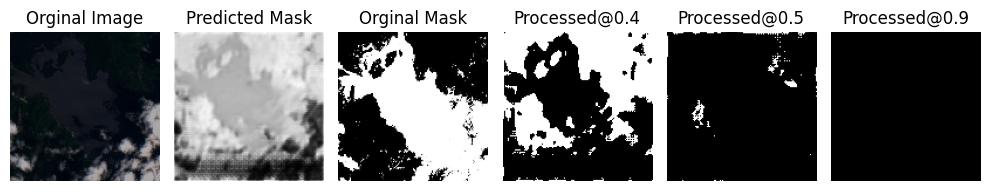

144/144 [==============================] - 30s 102ms/step - loss: 0.5302 - accuracy: 0.6000 - val_loss: 0.4694 - val_accuracy: 0.6195
Epoch 2/100
1/1 [==============================] - 0s 21ms/step


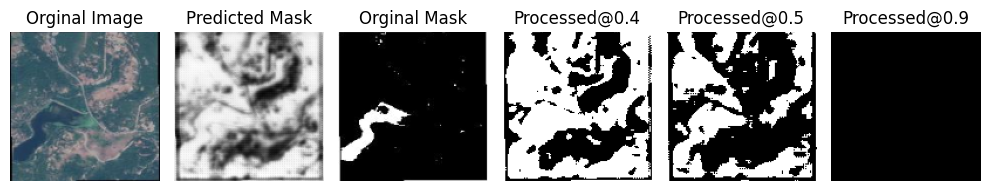

144/144 [==============================] - 9s 64ms/step - loss: 0.5742 - accuracy: 0.6131 - val_loss: 0.4887 - val_accuracy: 0.6120
Epoch 3/100
1/1 [==============================] - 0s 21ms/step


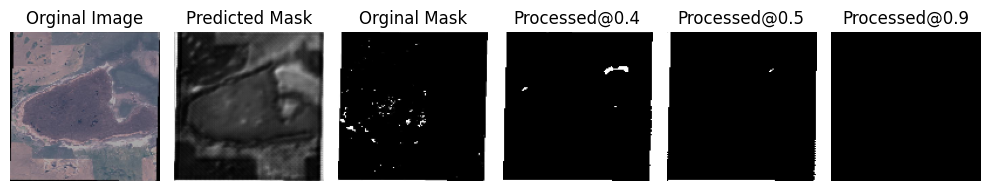

144/144 [==============================] - 9s 64ms/step - loss: 0.4926 - accuracy: 0.6242 - val_loss: 0.4563 - val_accuracy: 0.6200
Epoch 4/100
1/1 [==============================] - 0s 32ms/step


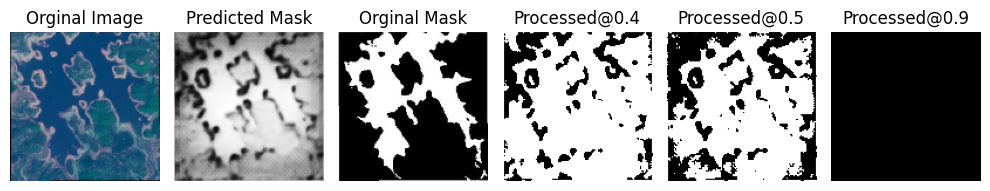

144/144 [==============================] - 10s 67ms/step - loss: 0.4590 - accuracy: 0.6388 - val_loss: 0.4328 - val_accuracy: 0.6384
Epoch 5/100
1/1 [==============================] - 0s 24ms/step


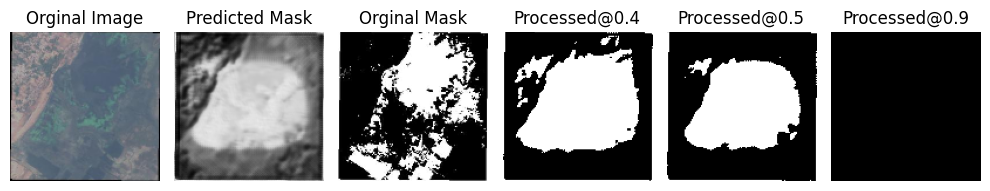

144/144 [==============================] - 9s 63ms/step - loss: 0.4473 - accuracy: 0.6469 - val_loss: 0.4418 - val_accuracy: 0.6442
Epoch 6/100
1/1 [==============================] - 0s 22ms/step


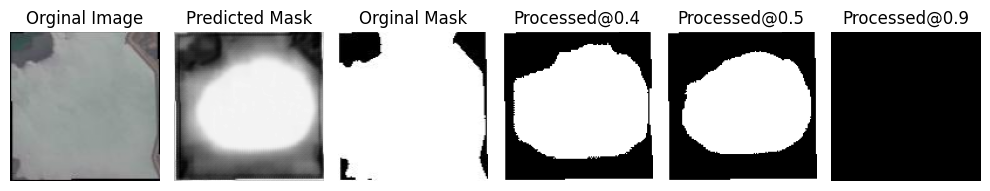

144/144 [==============================] - 9s 63ms/step - loss: 0.4306 - accuracy: 0.6569 - val_loss: 0.4341 - val_accuracy: 0.6387
Epoch 7/100
1/1 [==============================] - 0s 30ms/step


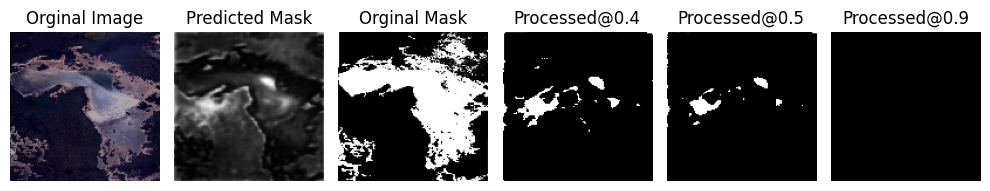

144/144 [==============================] - 10s 66ms/step - loss: 0.4100 - accuracy: 0.6698 - val_loss: 0.3729 - val_accuracy: 0.6817
Epoch 8/100
1/1 [==============================] - 0s 21ms/step


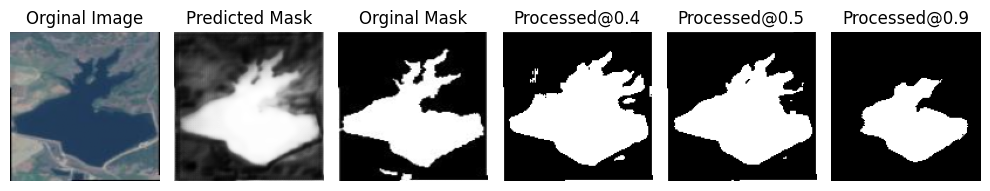

144/144 [==============================] - 9s 65ms/step - loss: 0.3918 - accuracy: 0.6819 - val_loss: 0.3523 - val_accuracy: 0.6947
Epoch 9/100
1/1 [==============================] - 0s 22ms/step


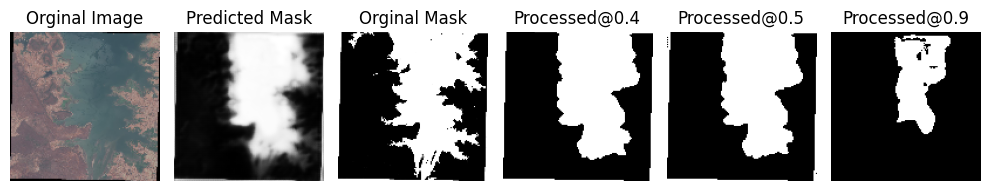

144/144 [==============================] - 9s 65ms/step - loss: 0.3806 - accuracy: 0.6878 - val_loss: 0.3406 - val_accuracy: 0.6972
Epoch 10/100
1/1 [==============================] - 0s 31ms/step


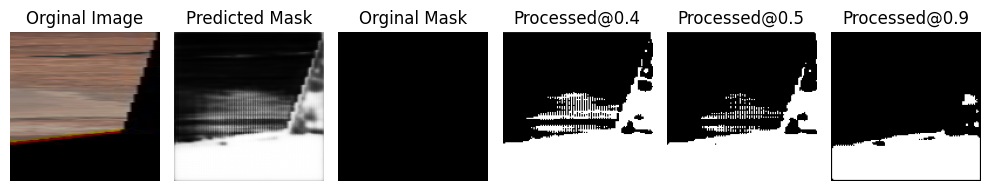

144/144 [==============================] - 10s 67ms/step - loss: 0.4081 - accuracy: 0.6859 - val_loss: 0.3421 - val_accuracy: 0.6943
Epoch 11/100
1/1 [==============================] - 0s 23ms/step


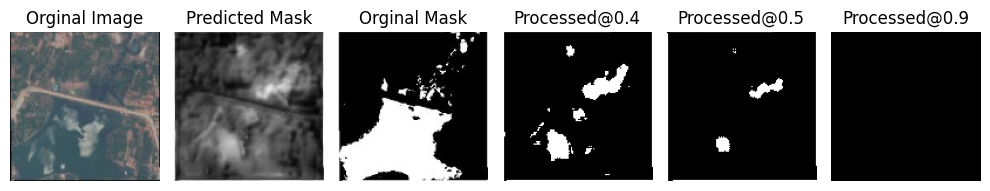

144/144 [==============================] - 9s 63ms/step - loss: 0.3673 - accuracy: 0.6962 - val_loss: 0.3384 - val_accuracy: 0.7079
Epoch 12/100
1/1 [==============================] - 0s 21ms/step


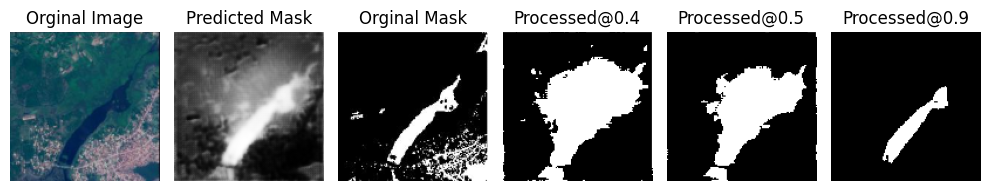

144/144 [==============================] - 9s 65ms/step - loss: 0.3526 - accuracy: 0.7014 - val_loss: 0.3426 - val_accuracy: 0.7065
Epoch 13/100
1/1 [==============================] - 0s 21ms/step


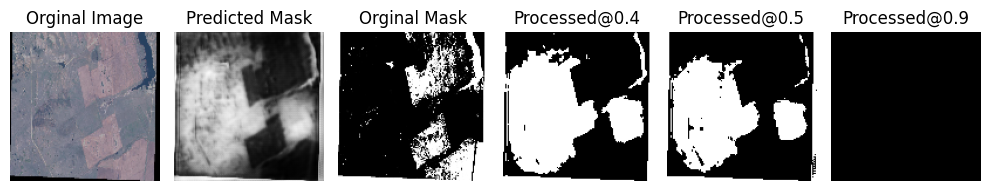

144/144 [==============================] - 9s 64ms/step - loss: 0.3436 - accuracy: 0.7069 - val_loss: 0.3262 - val_accuracy: 0.7079
Epoch 14/100
1/1 [==============================] - 0s 20ms/step


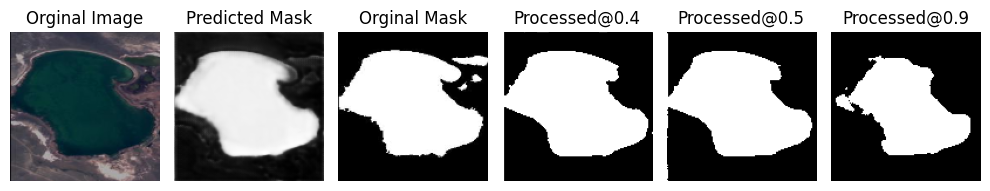

144/144 [==============================] - 9s 62ms/step - loss: 0.3350 - accuracy: 0.7094 - val_loss: 0.3291 - val_accuracy: 0.7058
Epoch 15/100
1/1 [==============================] - 0s 20ms/step


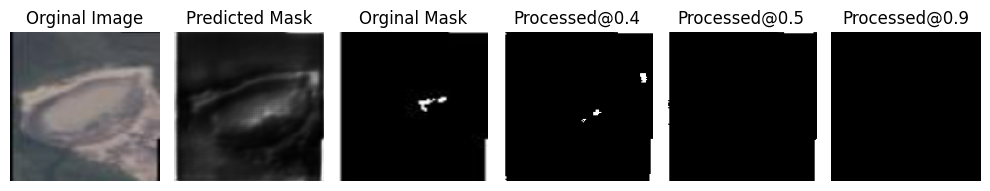

144/144 [==============================] - 9s 64ms/step - loss: 0.3284 - accuracy: 0.7120 - val_loss: 0.3122 - val_accuracy: 0.7099
Epoch 16/100
1/1 [==============================] - 0s 23ms/step


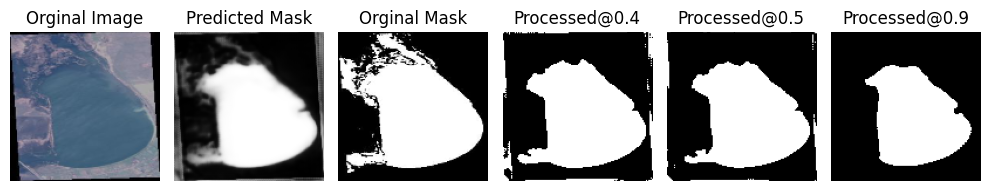

144/144 [==============================] - 9s 66ms/step - loss: 0.3210 - accuracy: 0.7160 - val_loss: 0.2939 - val_accuracy: 0.7212
Epoch 17/100
1/1 [==============================] - 0s 21ms/step


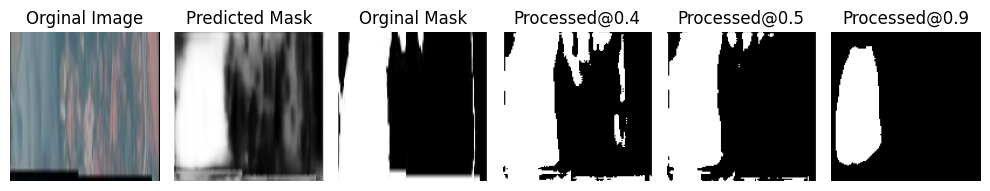

144/144 [==============================] - 9s 63ms/step - loss: 0.3160 - accuracy: 0.7179 - val_loss: 0.2986 - val_accuracy: 0.7154
Epoch 18/100
1/1 [==============================] - 0s 20ms/step


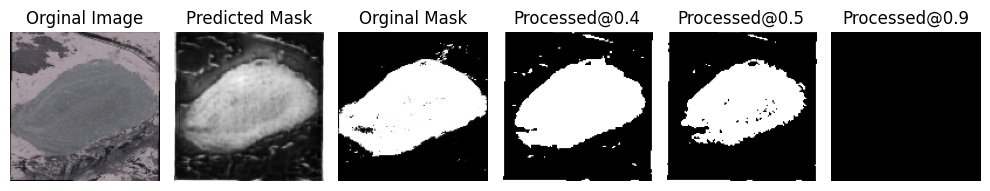

144/144 [==============================] - 9s 66ms/step - loss: 0.3112 - accuracy: 0.7193 - val_loss: 0.2874 - val_accuracy: 0.7225
Epoch 19/100
1/1 [==============================] - 0s 37ms/step


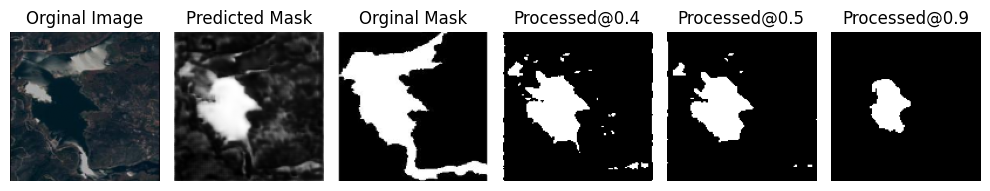

144/144 [==============================] - 10s 66ms/step - loss: 0.2986 - accuracy: 0.7243 - val_loss: 0.2786 - val_accuracy: 0.7228
Epoch 20/100
1/1 [==============================] - 0s 19ms/step


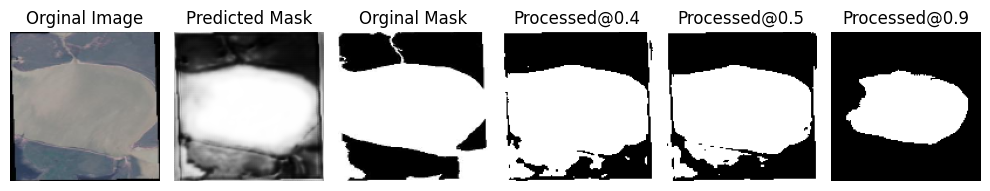

144/144 [==============================] - 9s 63ms/step - loss: 0.3044 - accuracy: 0.7219 - val_loss: 0.2948 - val_accuracy: 0.7141
Epoch 21/100
1/1 [==============================] - 0s 25ms/step


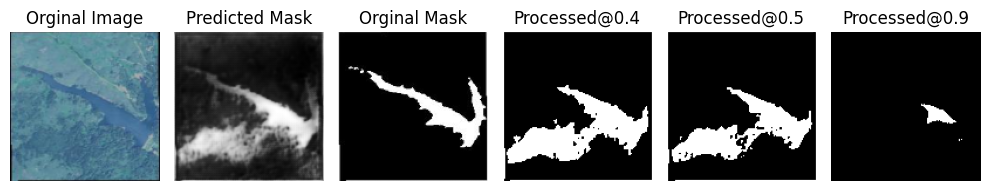

144/144 [==============================] - 9s 64ms/step - loss: 0.2957 - accuracy: 0.7250 - val_loss: 0.2683 - val_accuracy: 0.7276
Epoch 22/100
1/1 [==============================] - 0s 35ms/step


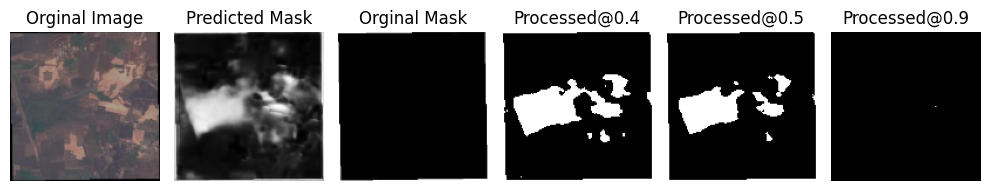

144/144 [==============================] - 9s 66ms/step - loss: 0.2931 - accuracy: 0.7262 - val_loss: 0.3008 - val_accuracy: 0.7137
Epoch 23/100
1/1 [==============================] - 0s 20ms/step


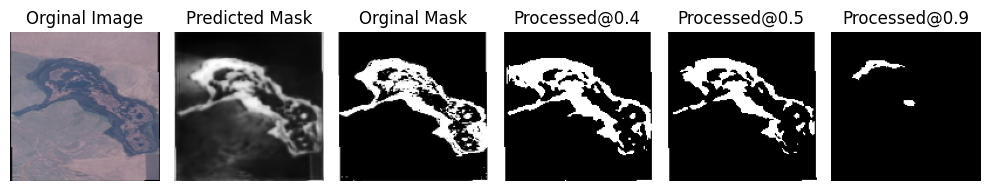

144/144 [==============================] - 9s 62ms/step - loss: 0.2904 - accuracy: 0.7272 - val_loss: 0.2793 - val_accuracy: 0.7277
Epoch 24/100
1/1 [==============================] - 0s 19ms/step


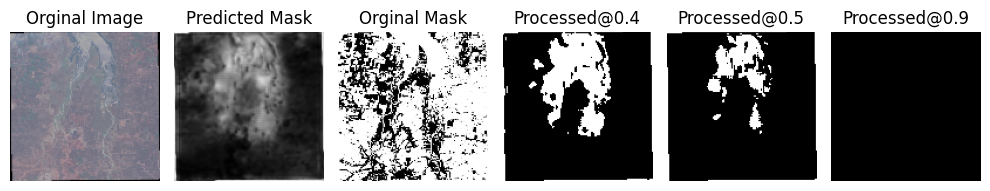

144/144 [==============================] - 10s 69ms/step - loss: 0.2854 - accuracy: 0.7294 - val_loss: 0.2633 - val_accuracy: 0.7323
Epoch 25/100
1/1 [==============================] - 0s 30ms/step


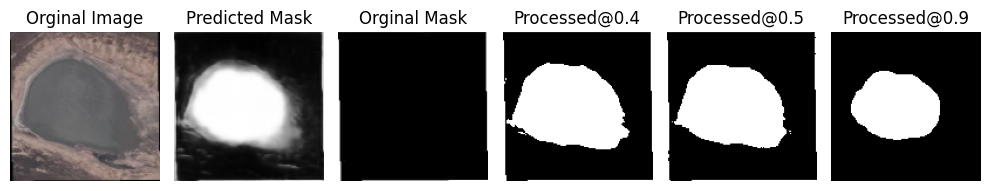

144/144 [==============================] - 10s 68ms/step - loss: 0.2837 - accuracy: 0.7296 - val_loss: 0.2490 - val_accuracy: 0.7350
Epoch 26/100
1/1 [==============================] - 0s 21ms/step


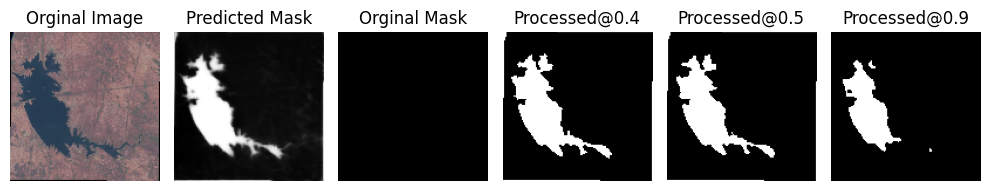

144/144 [==============================] - 9s 62ms/step - loss: 0.2782 - accuracy: 0.7318 - val_loss: 0.2584 - val_accuracy: 0.7314
Epoch 27/100
1/1 [==============================] - 0s 20ms/step


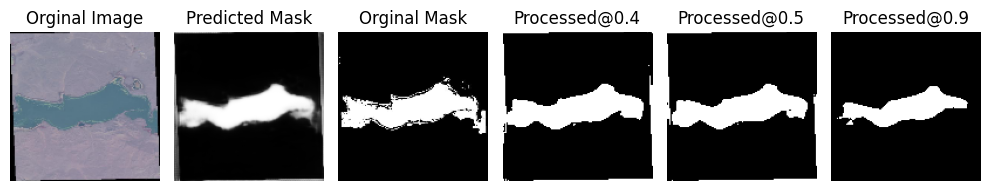

144/144 [==============================] - 9s 64ms/step - loss: 0.2774 - accuracy: 0.7319 - val_loss: 0.2574 - val_accuracy: 0.7310
Epoch 28/100
1/1 [==============================] - 0s 30ms/step


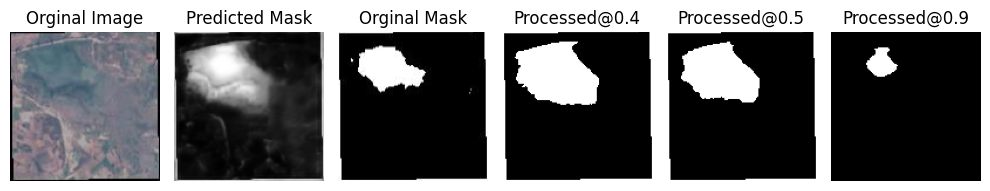

144/144 [==============================] - 10s 66ms/step - loss: 0.2753 - accuracy: 0.7328 - val_loss: 0.2566 - val_accuracy: 0.7314
CPU times: user 3min 49s, sys: 10.5 s, total: 4min
Wall time: 4min 43s


In [26]:
%%time
with tf.device("/GPU:0"):
  results = unet.fit(
      X, y,
      epochs=100,
      callbacks=callbacks,
      validation_split=0.1,
      batch_size=16
  )

## meanIoU Score

In [32]:
meanIoU = MeanIoU(num_classes=2)
for image, mask in zip(test_X, test_y):
    pred_mask = unet.predict(image[np.newaxis,...])
    meanIoU.update_state(mask, pred_mask)
print(meanIoU.result().numpy())

1/1 [==============================] - 0s 20ms/step
0.38313705


# Point Based Segmentation or rather Incomplete Mask Segmentation

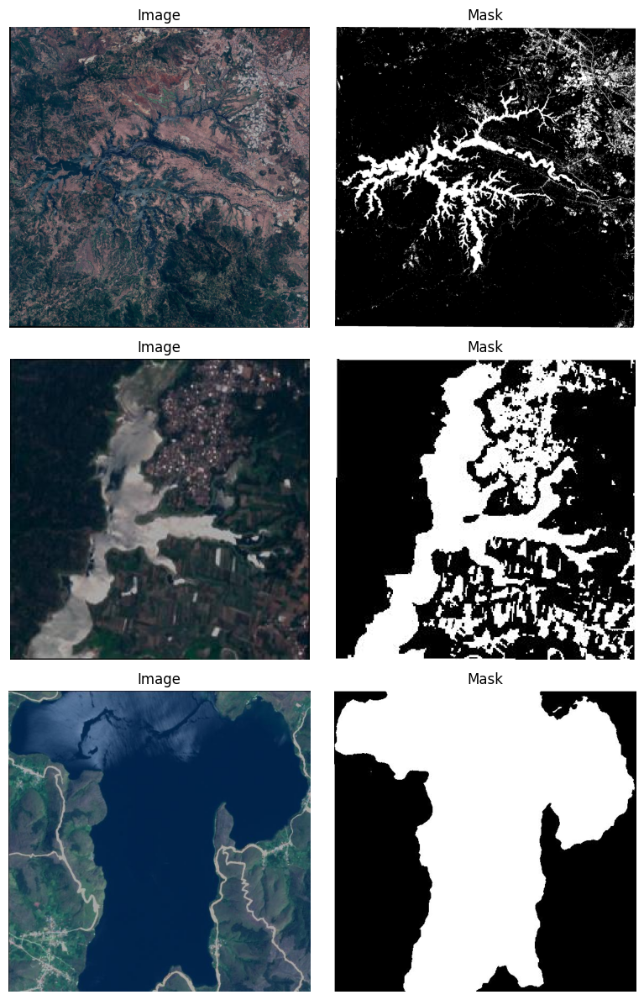

In [56]:
import os
import cv2
import matplotlib.pyplot as plt

image_dir = '/content/Water Bodies Dataset/Images'
mask_dir = '/content/Water Bodies Dataset/Masks'

image_files = sorted(os.listdir(image_dir))
mask_files = sorted(os.listdir(mask_dir))

def load_image_and_mask(image_path, mask_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    return image, mask

fig, axs = plt.subplots(3, 2, figsize=(8, 12))

for i in range(3):
    image_path = os.path.join(image_dir, image_files[i])
    mask_path = os.path.join(mask_dir, mask_files[i])
    image, mask = load_image_and_mask(image_path, mask_path)

    axs[i, 0].imshow(image)
    axs[i, 0].set_title('Image')
    axs[i, 0].axis('off')

    axs[i, 1].imshow(mask, cmap='gray')
    axs[i, 1].set_title('Mask')
    axs[i, 1].axis('off')

plt.tight_layout()
plt.show()


## A New Directory to Save Point masks

In [19]:
!mkdir -p "/content/Water Bodies Dataset/Point_Masks"

## generating Point Labels from the masks for incomplete tagging

2841
Saved: /content/Water Bodies Dataset/Point_Masks/water_body_1.jpg
Saved: /content/Water Bodies Dataset/Point_Masks/water_body_10.jpg
Saved: /content/Water Bodies Dataset/Point_Masks/water_body_100.jpg
Saved: /content/Water Bodies Dataset/Point_Masks/water_body_1000.jpg
Saved: /content/Water Bodies Dataset/Point_Masks/water_body_1002.jpg
Saved: /content/Water Bodies Dataset/Point_Masks/water_body_1003.jpg
Saved: /content/Water Bodies Dataset/Point_Masks/water_body_1004.jpg
Saved: /content/Water Bodies Dataset/Point_Masks/water_body_1006.jpg
Saved: /content/Water Bodies Dataset/Point_Masks/water_body_1008.jpg
Saved: /content/Water Bodies Dataset/Point_Masks/water_body_101.jpg
Saved: /content/Water Bodies Dataset/Point_Masks/water_body_1010.jpg
Saved: /content/Water Bodies Dataset/Point_Masks/water_body_1011.jpg
Saved: /content/Water Bodies Dataset/Point_Masks/water_body_1014.jpg
Saved: /content/Water Bodies Dataset/Point_Masks/water_body_1015.jpg
Saved: /content/Water Bodies Dataset

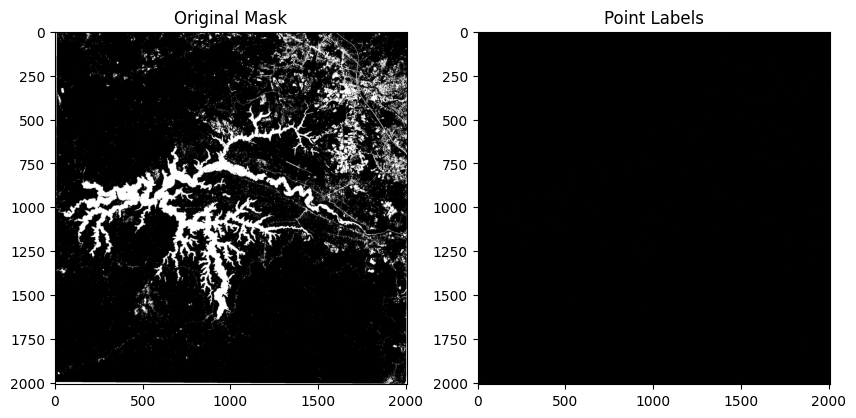

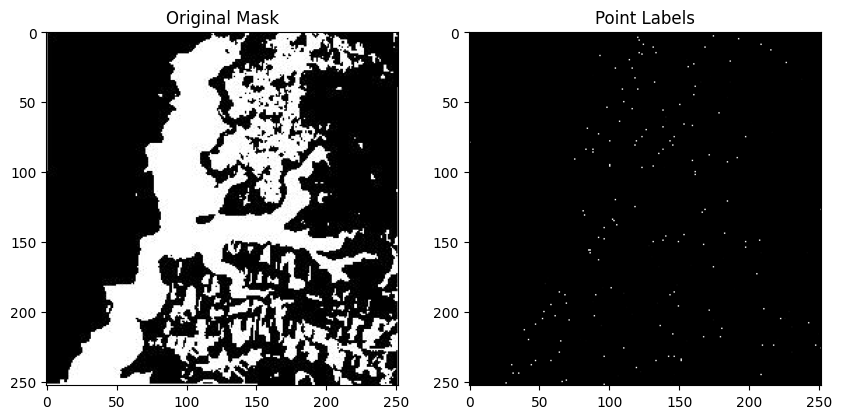

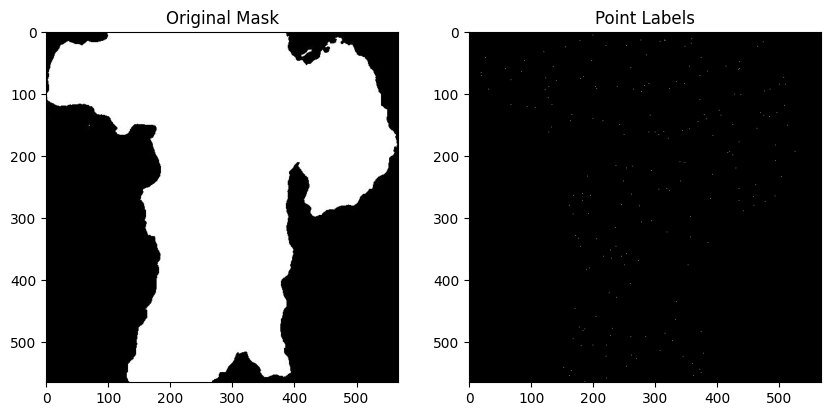

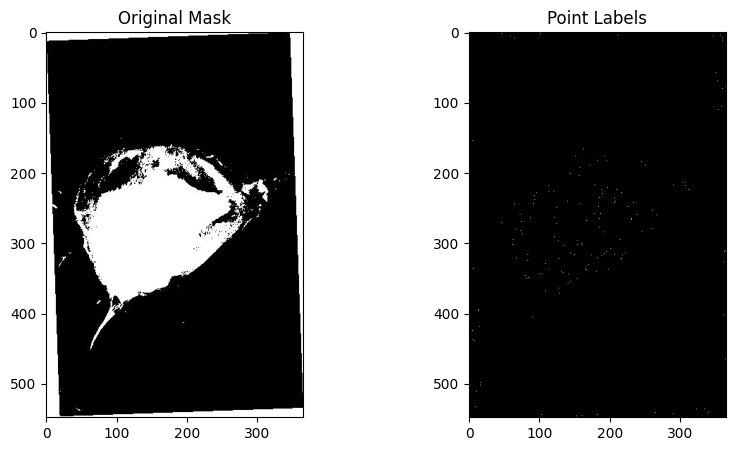

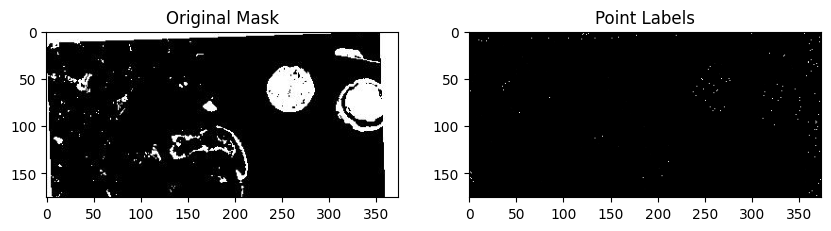

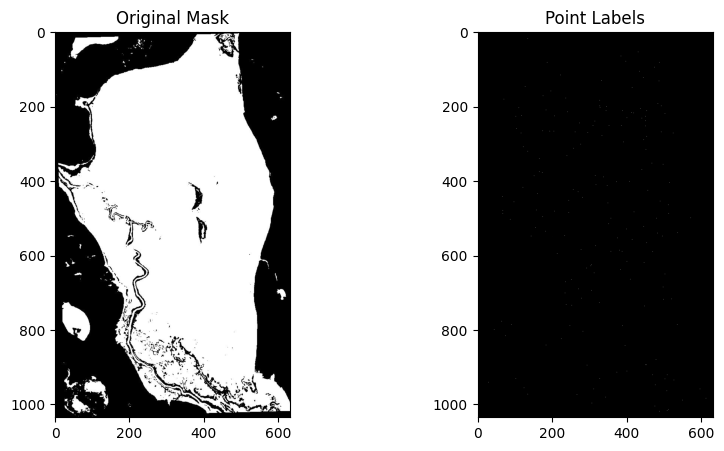

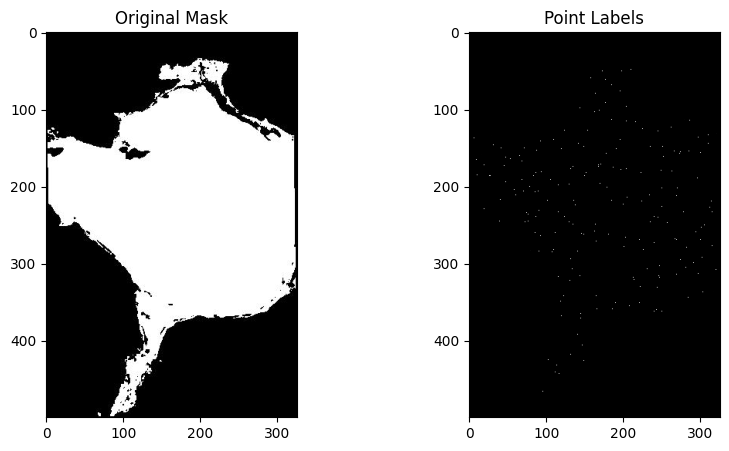

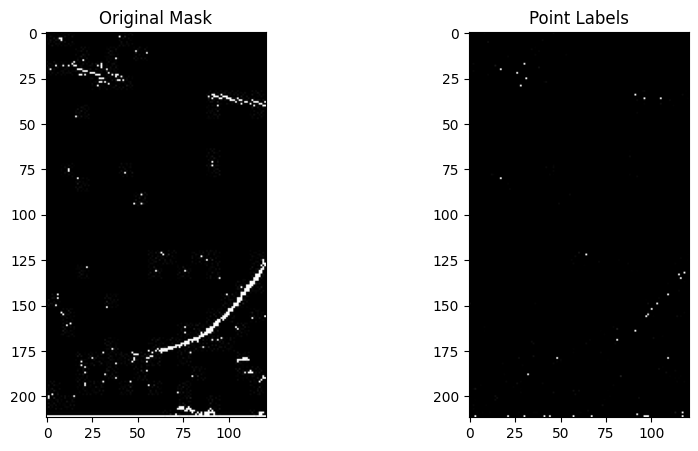

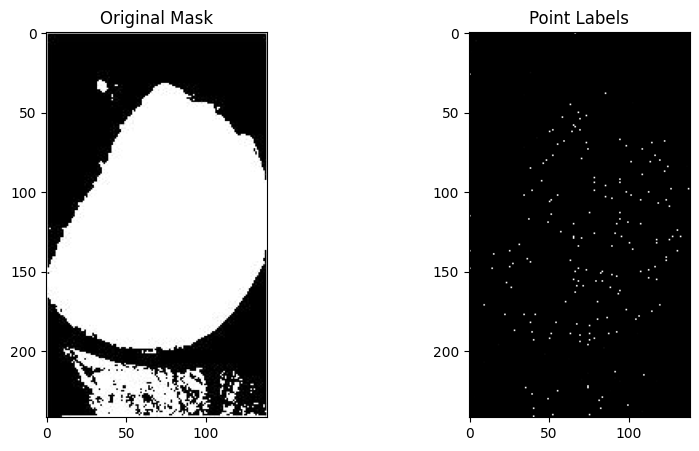

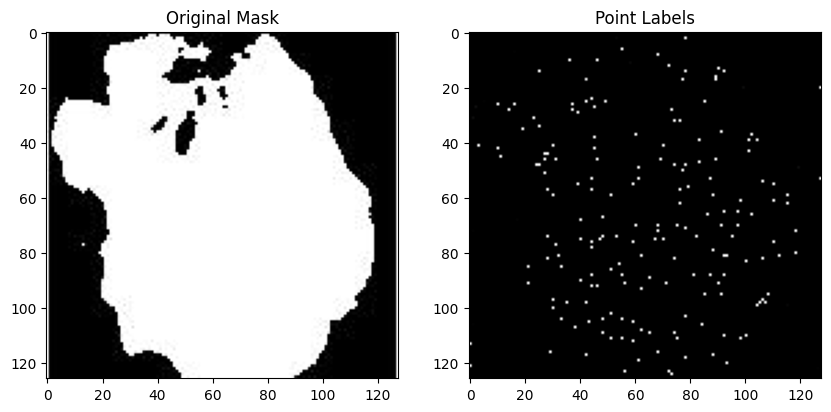

In [20]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch

# Define directories
image_dir = '/content/Water Bodies Dataset/Images'
mask_dir = '/content/Water Bodies Dataset/Masks'
path_point_masks = "/content/Water Bodies Dataset/Point_Masks"

os.makedirs(path_point_masks, exist_ok=True)

image_files = sorted(os.listdir(image_dir))
mask_files = sorted(os.listdir(mask_dir))

def load_image_and_mask(image_path, mask_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    return image, mask

for i in range(3):
    image_path = os.path.join(image_dir, image_files[i])
    mask_path = os.path.join(mask_dir, mask_files[i])
    image, mask = load_image_and_mask(image_path, mask_path)

def generate_point_labels(full_masks, num_points=10):
    """
    Simulate point labels from full segmentation masks.
    full_masks: List of masks as numpy arrays.
    num_points: Number of point labels to sample per image.
    """
    point_labels = []
    for mask in full_masks:
        points_mask = np.zeros_like(mask)
        indices = np.argwhere(mask > 0)
        selected_indices = indices[np.random.choice(indices.shape[0], num_points, replace=False)]
        for ind in selected_indices:
            points_mask[ind[0], ind[1]] = mask[ind[0], ind[1]]
        point_labels.append(points_mask)
    return point_labels

masks = [cv2.imread(os.path.join(mask_dir, mask_file), cv2.IMREAD_GRAYSCALE) for mask_file in mask_files]

point_labels = generate_point_labels(masks, num_points=200)
print(len(point_labels))

# Save point masks with the same names as the mask files
for i, point_mask in enumerate(point_labels):
    mask_file_name = mask_files[i]
    save_path = os.path.join(path_point_masks, mask_file_name)
    cv2.imwrite(save_path, point_mask)
    print(f"Saved: {save_path}")

# Optional: Display some masks and point labels for verification
for i in range(10):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(masks[i], cmap='gray')
    plt.title('Original Mask')
    plt.subplot(1, 2, 2)
    plt.imshow(point_labels[i], cmap='gray')
    plt.title('Point Labels')
    plt.show()


# PartialCrossEntropyLoss Implementation

In [6]:
import torch.nn as nn
import torch.nn.functional as F

class PartialCrossEntropyLoss(nn.Module):
    def __init__(self):
        super(PartialCrossEntropyLoss, self).__init__()

    def forward(self, predictions, targets, mask):
        targets = targets * mask
        predictions = predictions.permute(0, 2, 3, 1)
        predictions = predictions[mask == 1]
        targets = targets[mask == 1].long()

        if targets.numel() == 0:
            return torch.tensor(0.0, requires_grad=True, device=predictions.device)

        loss = F.cross_entropy(predictions, targets)
        return loss

## Again To Check the point mask images that we just Created are placed correctly or not

In [22]:
images = list()
mask = list()

image_path = '/content/Water Bodies Dataset/Images/'
point_mask_path = '/content/Water Bodies Dataset/Point_Masks/'

image_names = sorted(next(os.walk(image_path))[-1])
point_mask_names = sorted(next(os.walk(point_mask_path))[-1])

if image_names == point_mask_names:
  print('Images and point masks are corretly Placed!!')
else:
  print("They are not")

Images and point masks are corretly Placed!!


## Resizing the orginal images and the point mask images

In [25]:
SIZE = 128
images = np.zeros(shape=(len(image_names),SIZE, SIZE, 3))
masks = np.zeros(shape=(len(image_names),SIZE, SIZE, 1))

for id in tqdm(range(len(image_names)), desc="Images"):
  path = image_path + image_names[id]
  img = img_to_array(load_img(path)).astype('float')/255.
  img = cv.resize(img, (SIZE,SIZE), cv.INTER_AREA)
  images[id] = img

for id in tqdm(range(len(point_mask_names)), desc="Mask"):
  path = point_mask_path + point_mask_names[id]
  mask = img_to_array(load_img(path)).astype('float')/255.
  mask = cv.resize(mask, (SIZE,SIZE), cv.INTER_AREA)
  masks[id] = mask[:,:,:1]

Mask: 100%|██████████| 2841/2841 [00:27<00:00, 104.13it/s]


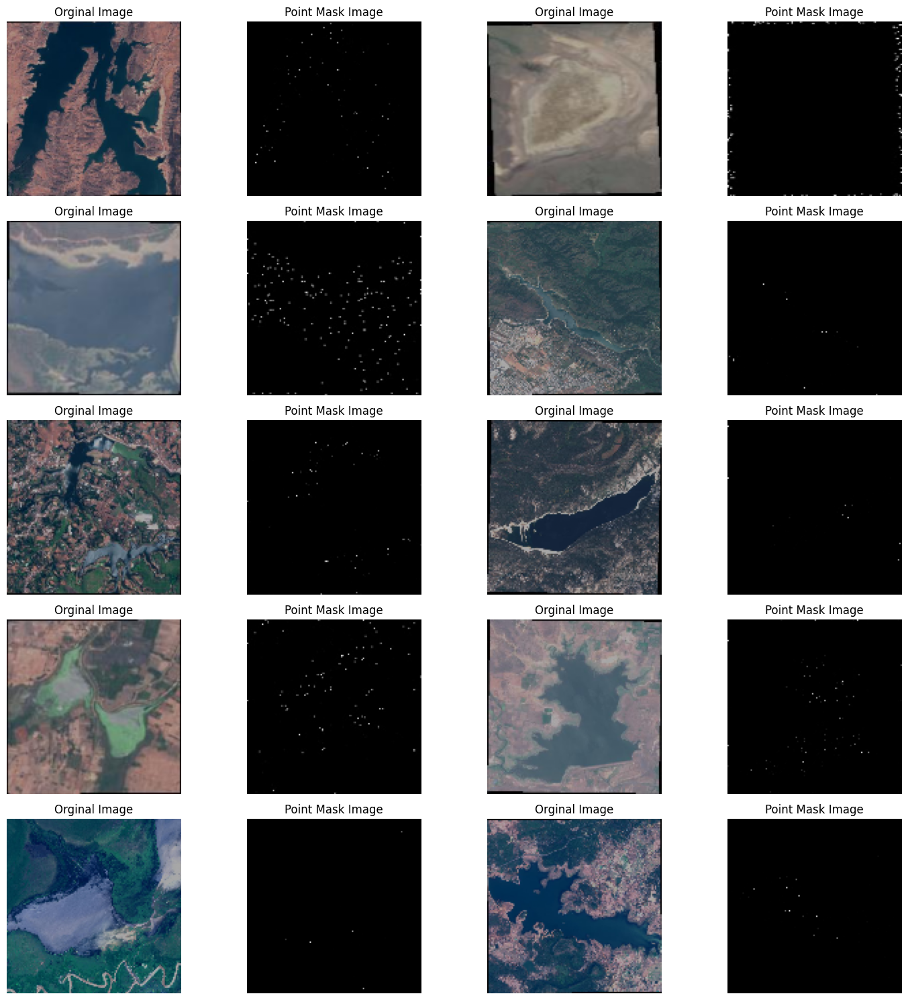

In [28]:
plt.figure(figsize=(15,15))
for i in range(1,21):
  plt.subplot(5,4,i)

  if i%2!=0:
    id = np.random.randint(len(images))
    show_image(images[id], title="Orginal Image")
  elif i%2==0:
    show_image(masks[id].reshape(128,128), title="Point Mask Image", cmap='gray')

plt.tight_layout()
plt.show()

In [29]:
X, y = images[:int(len(images)*0.9)], masks[:int(len(images)*0.9)]
test_X, test_y = images[int(len(images)*0.9):], masks[int(len(images)*0.9):]

## An iamge Enhancer Function i used this to have sharp edges and better Contrast on predicted regions

In [47]:
# Post Process
def post_process(image,threshold=0.4):
  return image>threshold


def enhance_contrast(image):
    img_uint8 = np.uint8(image * 255)
    enhanced_img = cv2.equalizeHist(img_uint8)
    enhanced_img = np.float32(enhanced_img) / 255.0
    return enhanced_img

In [48]:
# Contraction
class EncoderBlock(keras.layers.Layer):

  def __init__(self, filters, rate=None, pooling=True):
    super(EncoderBlock,self).__init__()
    self.filters = filters
    self.rate = rate
    self.pooling = pooling
    self.conv1 = Conv2D(self.filters,kernel_size=3,strides=1,padding='same',activation='relu',kernel_initializer='he_normal')
    self.conv2 = Conv2D(self.filters,kernel_size=3,strides=1,padding='same',activation='relu',kernel_initializer='he_normal')
    if self.pooling: self.pool = MaxPool2D(pool_size=(2,2))
    if self.rate is not None: self.drop = Dropout(rate)

  def call(self, inputs):
    x = self.conv1(inputs)
    if self.rate is not None: x = self.drop(x)
    x = self.conv2(x)
    if self.pooling:
      y = self.pool(x)
      return y, x
    else:
      return x

  def get_config(self):
    base_config = super().get_config()
    return {
        **base_config,
        "filters":self.filters,
        "rate":self.rate,
        "pooling":self.pooling
    }

# Expansion
class DecoderBlock(keras.layers.Layer):

  def __init__(self, filters, rate=None, axis=-1):
    super(DecoderBlock,self).__init__()
    self.filters = filters
    self.rate = rate
    self.axis = axis
    self.convT = Conv2DTranspose(self.filters,kernel_size=3,strides=2,padding='same')
    self.conv1 = Conv2D(self.filters, kernel_size=3, activation='relu', kernel_initializer='he_normal', padding='same')
    if rate is not None: self.drop = Dropout(self.rate)
    self.conv2 = Conv2D(self.filters, kernel_size=3, activation='relu', kernel_initializer='he_normal', padding='same')

  def call(self, inputs):
    X, short_X = inputs
    ct = self.convT(X)
    c_ = concatenate([ct, short_X], axis=self.axis)
    x = self.conv1(c_)
    if self.rate is not None: x = self.drop(x)
    y = self.conv2(x)
    return y

  def get_config(self):
    base_config = super().get_config()
    return {
        **base_config,
        "filters":self.filters,
        "rate":self.rate,
        "axis":self.axis,
    }

In [49]:
# Callback
class ShowProgress(keras.callbacks.Callback):
  def __init__(self, save=False):
    self.save = save
  def on_epoch_end(self, epoch, logs=None):
    id = np.random.randint(len(images))
    real_img = images[id][np.newaxis,...]
    pred_mask = self.model.predict(real_img).reshape(128,128)
    enhanced_mask = enhance_contrast(pred_mask)
    proc_mask1 = post_process(enhanced_mask)
    proc_mask2 = post_process(enhanced_mask, threshold=0.5)
    proc_mask3 = post_process(enhanced_mask, threshold=0.9)
    mask = masks[id].reshape(128,128)

    plt.figure(figsize=(10,5))

    plt.subplot(1,6,1)
    show_image(real_img[0], title="Orginal Image")

    plt.subplot(1,6,2)
    show_image(pred_mask, title="Predicted Mask", cmap='gray')

    plt.subplot(1,6,3)
    show_image(mask, title="Orginal Mask", cmap='gray')

    plt.subplot(1,6,4)
    show_image(proc_mask1, title="Processed@0.4", cmap='gray')

    plt.subplot(1,6,5)
    show_image(proc_mask2, title="Processed@0.5", cmap='gray')

    plt.subplot(1,6,6)
    show_image(proc_mask3, title="Processed@0.9", cmap='gray')

    plt.tight_layout()
    if self.save: plt.savefig("Progress-{}.png".format(epoch+1))
    plt.show()

In [50]:
inputs= Input(shape=(SIZE,SIZE,3))

# Contraction
p1, c1 = EncoderBlock(16,0.1)(inputs)
p2, c2 = EncoderBlock(32,0.1)(p1)
p3, c3 = EncoderBlock(64,0.2)(p2)
p4, c4 = EncoderBlock(128,0.2)(p3)

# Encoding Layer
c5 = EncoderBlock(256,rate=0.3,pooling=False)(p4)

# Expansion
d1 = DecoderBlock(128,0.2)([c5,c4]) # [current_input, skip_connection]
d2 = DecoderBlock(64,0.2)([d1,c3])
d3 = DecoderBlock(32,0.1)([d2,c2])
d4 = DecoderBlock(16,0.1, axis=3)([d3,c1])

# Outputs
outputs = Conv2D(1,1,activation='sigmoid')(d4)

unet = keras.models.Model(
    inputs=[inputs],
    outputs=[outputs],
)

In [51]:
unet.compile(
    loss='binary_crossentropy',
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=['accuracy']
)


In [52]:
callbacks = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint('UNet-01.h5',save_best_only=True),
    ShowProgress(save=True)
]

In [53]:
unet.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 encoder_block_5 (EncoderBl  ((None, 64, 64, 16),         2768      ['input_2[0][0]']             
 ock)                         (None, 128, 128, 16))                                               
                                                                                                  
 encoder_block_6 (EncoderBl  ((None, 32, 32, 32),         13888     ['encoder_block_5[0][0]']     
 ock)                         (None, 64, 64, 32))                                                 
                                                                                            

## Finaly we train the network on point Mask images and See the Results

Epoch 1/100
  6/144 [>.............................] - ETA: 10s - loss: 0.2270 - accuracy: 0.8233

1/1 [==============================] - 0s 332ms/step


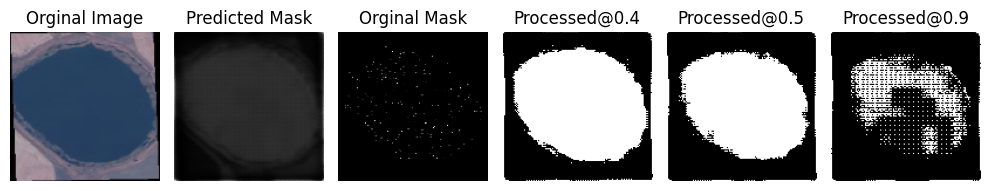

144/144 [==============================] - 18s 74ms/step - loss: 0.0422 - accuracy: 0.8505 - val_loss: 0.0355 - val_accuracy: 0.8393
Epoch 2/100
1/1 [==============================] - 0s 21ms/step


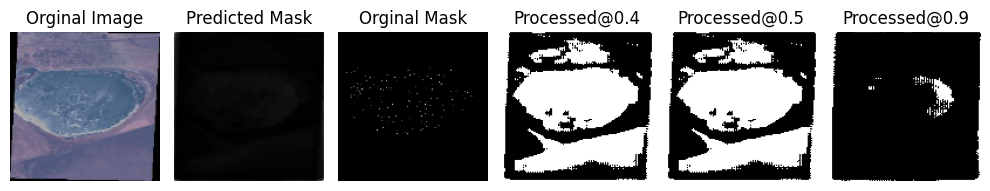

144/144 [==============================] - 10s 68ms/step - loss: 0.0296 - accuracy: 0.8520 - val_loss: 0.0299 - val_accuracy: 0.8393
Epoch 3/100
1/1 [==============================] - 0s 21ms/step


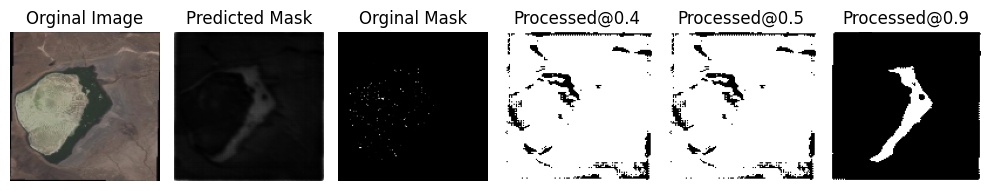

144/144 [==============================] - 9s 65ms/step - loss: 0.0291 - accuracy: 0.8520 - val_loss: 0.0310 - val_accuracy: 0.8393
Epoch 4/100
1/1 [==============================] - 0s 21ms/step


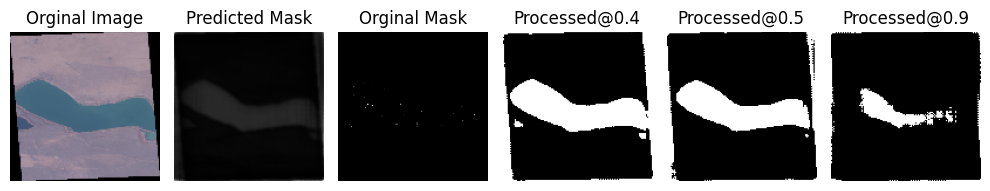

144/144 [==============================] - 10s 69ms/step - loss: 0.0281 - accuracy: 0.8520 - val_loss: 0.0310 - val_accuracy: 0.8393
Epoch 5/100
1/1 [==============================] - 0s 24ms/step


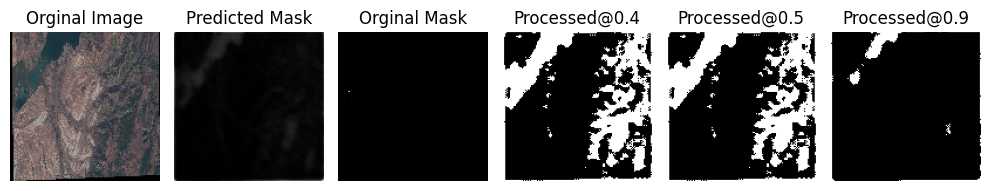

144/144 [==============================] - 9s 65ms/step - loss: 0.0276 - accuracy: 0.8520 - val_loss: 0.0403 - val_accuracy: 0.8393
CPU times: user 49.3 s, sys: 3.73 s, total: 53 s
Wall time: 59.2 s


In [54]:
%%time
with tf.device("/GPU:0"):
  results = unet.fit(
      X, y,
      epochs=100,
      callbacks=callbacks,
      validation_split=0.1,
      batch_size=16
  )